In [49]:
import xgboost
import shap
import pandas as pd
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_recall_curve, roc_curve
import numpy as np
import matplotlib.pyplot as plt
import plots as plots
import pickle
import lime
import lime.lime_tabular

# Load data and models

In [50]:
data = pickle.load(open('xgb_models/data5.pkl', 'rb'))
model = pickle.load(open('xgb_models/opt_XGB_YN5.pkl', 'rb'))

X_train_target = data['X_train_target']
X_test_target = data['X_test_target']
X = data['X']

X_train = data['X_train']
X_test = data['X_test']
X_val = data['X_val']
X_all = data['X_all']

y_train = data['y_train']
y_test = data['y_test']
y_val = data['y_val']
y = data['y']

## Accuracy

In [51]:
print('Training score: %.2f%%' %(model.score(X_train, y_train) * 100))
print('Testing score: %.2f%%' %(model.score(X_test, y_test) * 100))
print('Overall score: %.2f%%' %(model.score(X_all, y) * 100))

Training score: 86.49%
Testing score: 81.54%
Overall score: 85.58%


pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


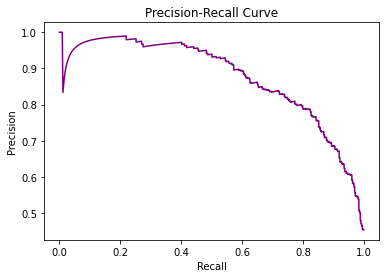

In [52]:
#use logistic regression model to make predictions
y_score = model.predict_proba(X_test)[:, 1]

#calculate precision and recall
precision, recall, thresholds = precision_recall_curve(y_test, y_score)

#create precision recall curve
fig, ax = plt.subplots()
ax.plot(recall, precision, color='purple')

#add axis labels to plot
ax.set_title('Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

#display plot
plt.show()

In [53]:
def plot_roc_cur(fper, tper):  
    plt.plot(fper, tper, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


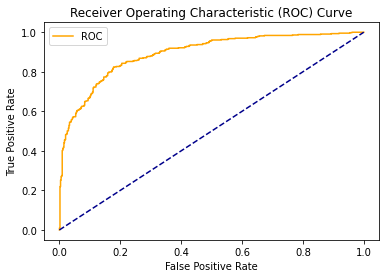

In [54]:
probs = model.predict_proba(X_test)[:, 1]
fper, tper, thresholds = roc_curve(y_test, probs) 
plot_roc_cur(fper, tper)

In [55]:
def plot_summary(idx, shap_values, Xdata):
    shap.plots.waterfall(shap_values[idx])
    plots.prob_barh(model.predict_proba(Xdata)[idx])
    print('Percentile compare to the overall dataset')
    plots.percentile_score(shap_values[idx],Xdata)

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


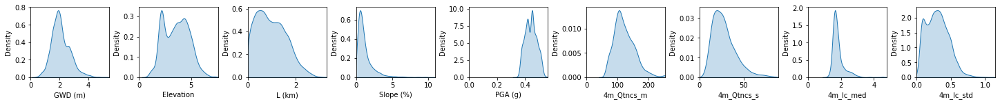

In [56]:
plots.distribution(X_all)

# Local explanations

## Training dataset

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


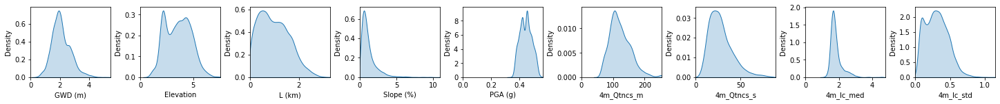

In [57]:
plots.distribution(X_train)

## Case of lateral spreading

In [58]:
# explain the model's predictions using SHAP
# compute SHAP values
explainer = shap.TreeExplainer(model)
shap_values = explainer(X_train)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [59]:
X_train.head()

,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std
6043,1.718826,1.811603,0.535128,0.397376,0.440895,130.469944,31.164076,1.701118,0.434006
5613,1.518877,2.115037,0.380435,0.459704,0.457163,89.324877,20.448650,1.988205,0.301661
4002,1.316730,1.710117,0.234274,0.623473,0.508720,215.483162,14.022323,1.407359,0.059551
1067,2.401471,3.330867,1.718972,2.861161,0.516319,116.008408,14.196668,1.927262,0.184131
854,2.585827,2.902272,0.585417,0.030798,0.471470,162.944311,13.026224,1.595586,0.045170


In [60]:
feature_names = ['GWD (m)', 'Elevation', 'L (km)', 'Slope (%)', 'PGA (g)', '4m_Qtncs_m', '4m_Qtncs_s', '4m_Ic_med', '4m_Ic_std']
target_names = ['Lateral Spreading', 'No Lateral Spreading']
lm = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=target_names, discretize_continuous=False)

In [61]:
X_train.reset_index()
X_train_target = X_train_target.reset_index()

In [62]:
X_train_target.loc[X_train_target['Target']==1].loc[X_train_target['L (km)'] < 0.1]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target
26,5829,24517.0,1.885435,2.147271,0.067296,0.171548,0.426110,123.522707,26.574835,1.849379,0.298623,1
32,3880,15772.0,1.436169,1.661978,0.055705,0.518974,0.499179,120.341809,34.777180,1.622254,0.206404,1
53,3979,25089.0,1.397046,1.305830,0.072770,0.246042,0.513281,120.065617,24.190764,1.671888,0.119248,1
55,189,15771.0,1.175442,2.108382,0.053438,0.970473,0.438175,89.717102,18.765320,1.765700,0.337298,1
74,5883,24531.0,1.926204,2.138346,0.063073,0.493038,0.425282,119.248751,19.853865,1.768773,0.158775,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5009,5822,27943.0,1.869850,2.159450,0.070883,0.674246,0.426110,110.360455,16.847572,1.723786,0.312751,1
5045,6190,56.0,1.783620,1.916764,0.018390,3.176269,0.435868,92.718077,18.062477,1.651151,0.191744,1
5066,5726,49.0,1.390997,1.969447,0.017915,2.341863,0.433571,90.689977,16.722130,1.823108,0.297967,1
5083,5827,24525.0,1.869850,2.197630,0.076357,0.519532,0.426110,109.570423,14.601220,1.735126,0.190005,1


This is the case where the length to the river is short

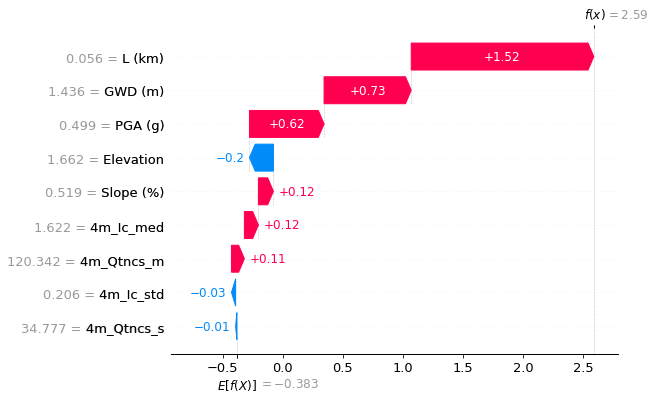

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


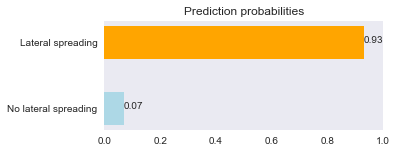

Percentile compare to the overall dataset


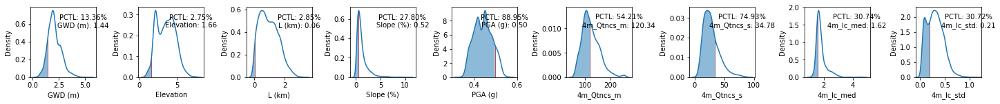

In [63]:
idx = 32
plot_summary(idx, shap_values, X_train)

In [64]:
idx = 32
exp = lm.explain_instance(X_train.iloc[idx], model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(predict_proba=False)

## Case of no lateral spreading

In [65]:
X_train_target.loc[X_train_target['Target']==0].loc[X_train_target['L (km)'] > 3]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target
60,4097,32250.0,1.023264,4.990308,3.069003,0.109984,0.357425,62.116346,14.028336,3.007124,0.497284,0
1314,4085,19563.0,1.667777,5.748554,3.289537,0.068539,0.354464,63.259817,11.158269,3.161076,0.480324,0
2086,4103,16832.0,0.669578,4.666982,3.001999,1.740389,0.362695,62.645706,10.220747,2.859222,0.369820,0
2768,4100,22454.0,1.058862,5.097780,3.084513,0.768944,0.357425,60.215281,11.549988,3.157010,0.395888,0


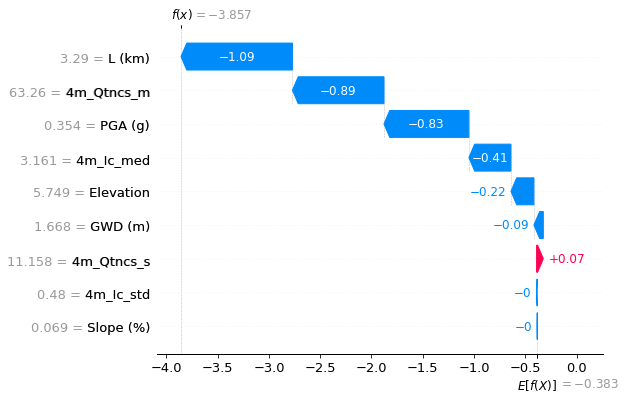

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


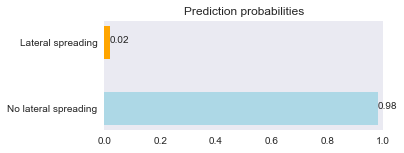

Percentile compare to the overall dataset


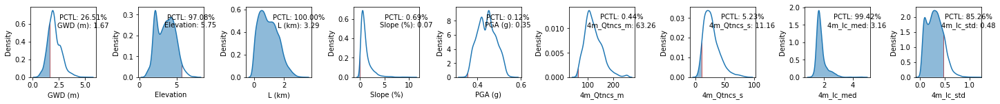

In [66]:
# visualize no lateral spreading prediction explanation
idx = 1314
plot_summary(idx, shap_values, X_train)

In [67]:
idx = 1314
exp = lm.explain_instance(X_train.iloc[idx], model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(predict_proba=False)

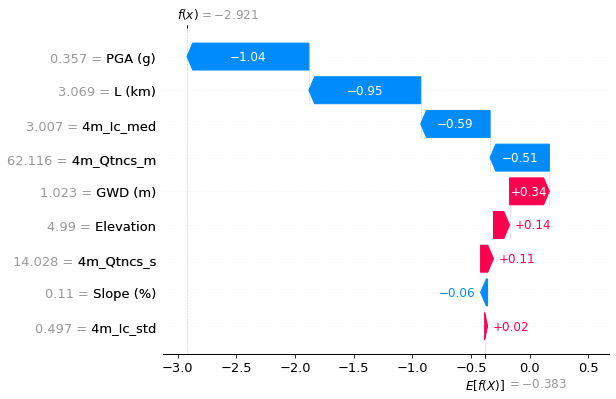

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


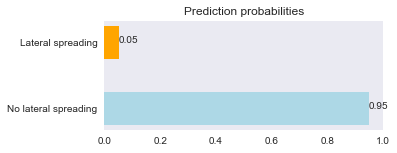

Percentile compare to the overall dataset


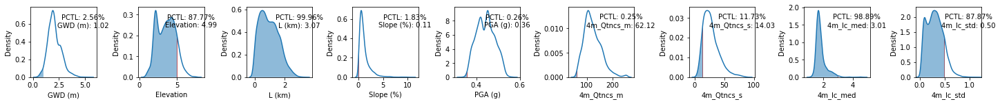

In [68]:
# visualize no lateral spreading prediction explanation
idx = 60
plot_summary(idx, shap_values, X_train)

In [69]:
idx = 60
exp = lm.explain_instance(X_train.iloc[idx], model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(predict_proba=False)

# Local explanations (Grouped by Type)

## Accuracy

In [70]:
# make prediction
preds = model.predict(X_test)
predictions = [round(value) for value in preds]
# evaluate predictions
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 81.54%


pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


In [71]:
# Create a dataframe with errors
test_targets = X_test_target['Target']
error = predictions - test_targets
testdf = pd.concat([X_test_target, pd.DataFrame({'error':error})], axis=1)

## True Positive

In [72]:
# Target = 1 (lateral spreading)
tp = testdf[testdf['error'] == 0]
tp = tp[tp['Target'] == 1]

X_true_pos = tp.drop(['Test ID', 'Target', 'error'], axis=1)
tp.head()

,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
3630,26109.0,1.790882,3.825384,1.348634,0.262668,0.464188,154.961167,24.552125,1.548614,0.099001,1,0
5796,28764.0,1.882595,2.106439,0.083856,0.297980,0.446919,139.517950,22.888558,1.622310,0.110552,1,0
5834,21574.0,1.885435,2.156720,0.075817,0.171548,0.426110,121.467001,24.462504,1.708205,0.323477,1,0
2704,27657.0,2.522350,4.037776,1.284956,1.072127,0.424088,153.792517,20.457045,1.848821,0.138858,1,0
2407,2167.0,1.237628,2.838439,0.545491,0.790183,0.461705,111.630967,37.466281,1.779401,0.297537,1,0


Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


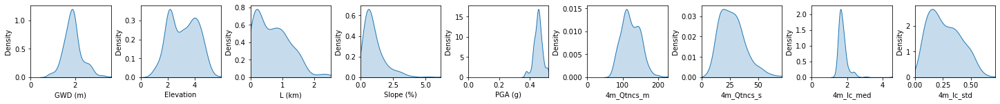

In [73]:
plots.distribution(X_true_pos)

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


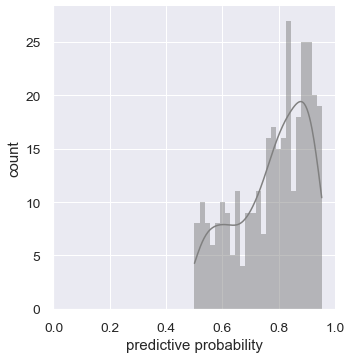

In [74]:
# Prediction probability
prob = model.predict_proba(X_true_pos)
plots.pred_prob(prob[:,1])

In [75]:
# SHAP values of false positive dataset
tp_shap_values = explainer(X_true_pos)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [76]:
tp = tp.reset_index()
tp.head()

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
0,3630,26109.0,1.790882,3.825384,1.348634,0.262668,0.464188,154.961167,24.552125,1.548614,0.099001,1,0
1,5796,28764.0,1.882595,2.106439,0.083856,0.297980,0.446919,139.517950,22.888558,1.622310,0.110552,1,0
2,5834,21574.0,1.885435,2.156720,0.075817,0.171548,0.426110,121.467001,24.462504,1.708205,0.323477,1,0
3,2704,27657.0,2.522350,4.037776,1.284956,1.072127,0.424088,153.792517,20.457045,1.848821,0.138858,1,0
4,2407,2167.0,1.237628,2.838439,0.545491,0.790183,0.461705,111.630967,37.466281,1.779401,0.297537,1,0


### Specific site
> 34592

In [149]:
X_train_target[X_train_target['Test ID']==34592]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target
4651,2530,34592.0,1.635145,3.473548,0.701107,0.252856,0.461018,97.555945,12.389104,1.899276,0.205926,1


In [152]:
explainer = shap.TreeExplainer(model)
shap_values = explainer(X_train)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


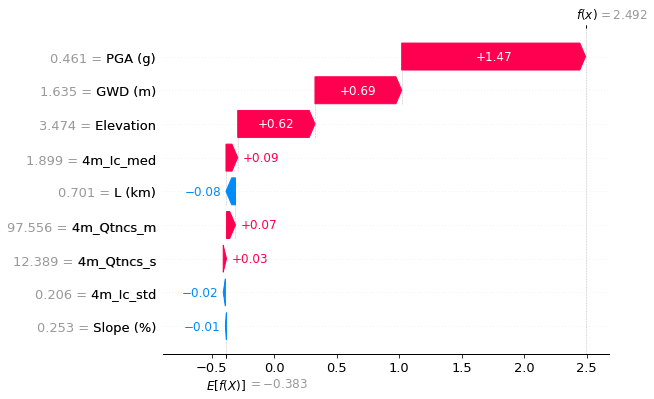

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


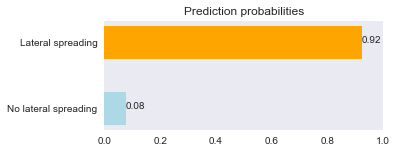

Percentile compare to the overall dataset


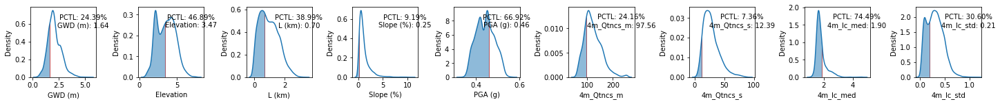

In [154]:
# visualize no lateral spreading prediction explanation
idx = 4651
plot_summary(idx, shap_values, X_train)

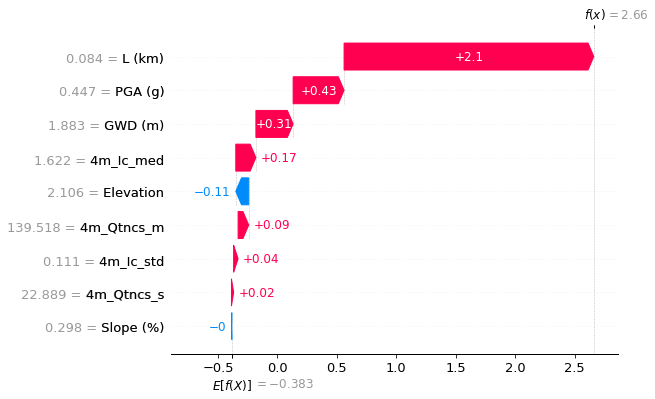

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


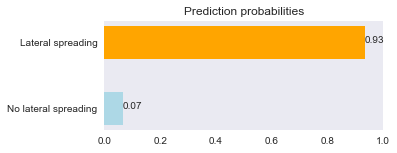

Percentile compare to the overall dataset


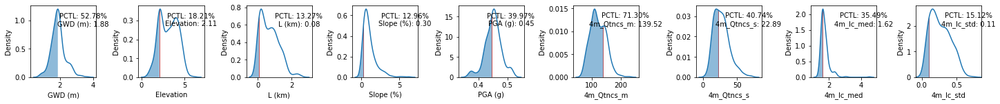

In [155]:
# visualize lateral spreading prediction's explanation
idx = 1
plot_summary(idx, tp_shap_values, X_true_pos)

In [78]:
idx = 1
exp = lm.explain_instance(X_true_pos.iloc[idx], model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(predict_proba=False, show_all=True)

#### Large distance (L > 2 km), why do we still predict lateral spreading?

In [79]:
tpfar = tp[tp['L (km)'] > 2]
Xfar = tpfar.drop(['index', 'Test ID', 'Target', 'error'], axis=1)
tpfar.head()

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
18,4110,38514.0,0.805172,4.494415,2.531656,0.502326,0.374701,92.157257,27.339162,2.361183,0.393691,1,0
61,4774,5269.0,1.721808,4.690317,2.101612,0.719466,0.378829,203.992168,68.488074,1.368223,0.304907,1,0
106,4104,48825.0,0.939028,4.621104,2.374267,0.837824,0.377765,81.997895,17.007677,2.356978,0.524917,1,0
142,4777,3781.0,1.710468,4.985128,2.096897,1.343429,0.375793,159.602052,51.772615,1.513947,0.185505,1,0
216,4109,48826.0,0.980644,4.616069,2.370803,0.769912,0.377765,79.415642,19.284361,2.512050,0.445538,1,0


Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


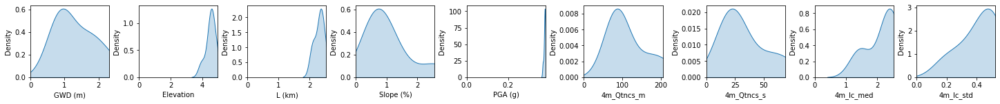

In [80]:
plots.distribution(Xfar)

In [81]:
# SHAP values of X far dataset
xfar_shap_values = explainer(Xfar)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


### Length is > 2.45 kms but the GWD is closer to the surface

In [82]:
tpfar = tpfar.reset_index()
tpfar.loc[tpfar['L (km)']>2.45]

,level_0,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
0,18,4110,38514.0,0.805172,4.494415,2.531656,0.502326,0.374701,92.157257,27.339162,2.361183,0.393691,1,0


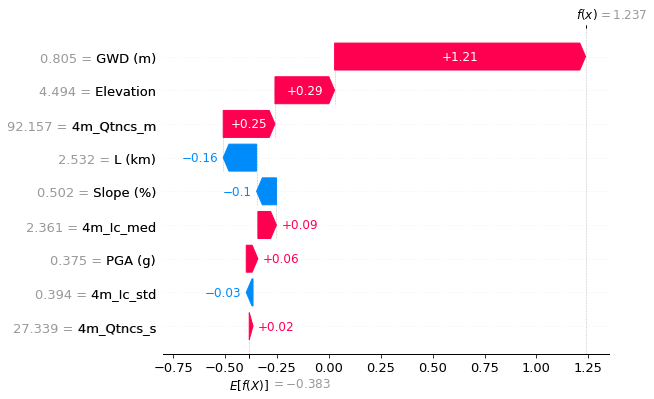

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


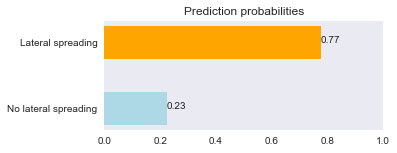

Percentile compare to the overall dataset


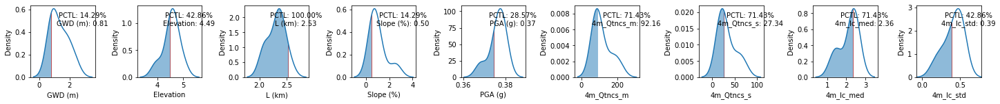

In [83]:
# visualize lateral spreading prediction's explanation
idx = 0
plot_summary(idx, xfar_shap_values, Xfar)

In [84]:
idx = 0
exp = lm.explain_instance(Xfar.iloc[idx], model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(predict_proba=False, show_all=True)

### GWD is deep

In [85]:
tpfar.loc[tpfar['GWD (m)'] > 2]

,level_0,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
6,296,1690,24628.0,2.314934,4.429238,2.31766,2.562188,0.368342,91.292406,21.976481,2.262392,0.506531,1,0


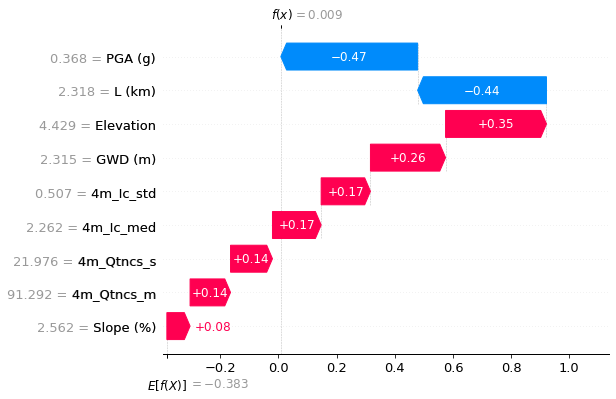

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


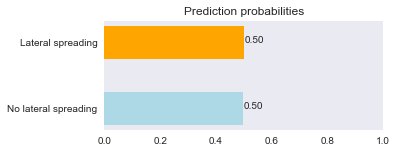

Percentile compare to the overall dataset


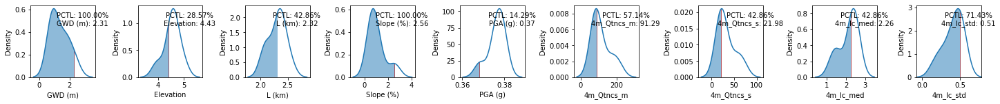

In [86]:
idx = 6
plot_summary(idx, xfar_shap_values, Xfar)

In [87]:
idx = 6
exp = lm.explain_instance(Xfar.iloc[idx], model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(predict_proba=False, show_all=True)

## True Negative

In [88]:
# Target = 0 (no-lateral spreading)
tn = testdf[testdf['error'] == 0]
tn = tn[tn['Target'] == 0]

X_true_neg = tn.drop(['Test ID', 'Target', 'error'], axis=1)
tn = tn.reset_index()
tn.head()

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
0,161,38414.0,2.018221,2.782394,0.681779,0.632241,0.419531,152.655583,26.980689,1.534267,0.301355,0,0
1,1643,32907.0,2.778554,4.800351,1.450625,0.993102,0.386724,112.841893,20.536477,1.694060,0.312233,0,0
2,119,513.0,1.605895,3.570586,2.199005,0.237995,0.377088,100.790835,41.625430,1.805311,0.380042,0,0
3,4321,34314.0,2.248602,5.811677,2.622328,0.274640,0.366673,64.292076,12.382702,2.971816,0.473880,0,0
4,6297,37672.0,2.057632,2.245837,0.284873,0.111626,0.447333,118.740509,32.146269,1.629898,0.284931,0,0


Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


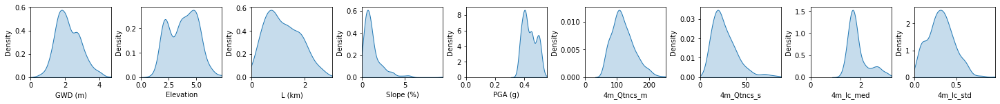

In [89]:
plots.distribution(X_true_neg)

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


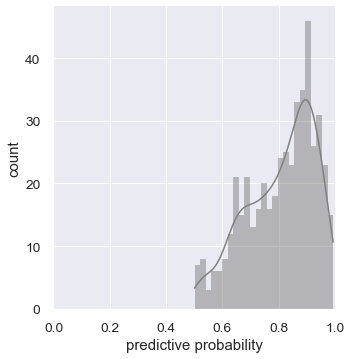

In [90]:
# Prediction probability
prob = model.predict_proba(X_true_neg)
plots.pred_prob(prob[:,0])

In [91]:
# SHAP values of X far dataset
tn_shap_values = explainer(X_true_neg)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


### No lateral spreading due to far away distance

In [92]:
tn.loc[tn['L (km)'] > 2].head()

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
2,119,513.0,1.605895,3.570586,2.199005,0.237995,0.377088,100.790835,41.625430,1.805311,0.380042,0,0
3,4321,34314.0,2.248602,5.811677,2.622328,0.274640,0.366673,64.292076,12.382702,2.971816,0.473880,0,0
11,4428,37710.0,1.829858,5.426878,2.068942,0.791967,0.381214,77.237806,12.474412,2.450964,0.358298,0,0
14,4105,32251.0,1.017751,4.782964,3.034131,0.480071,0.359753,61.719326,19.470568,3.101035,0.596999,0,0
20,4090,37128.0,0.509307,4.509655,2.809299,1.173059,0.366222,72.730491,15.449340,2.548011,0.467923,0,0


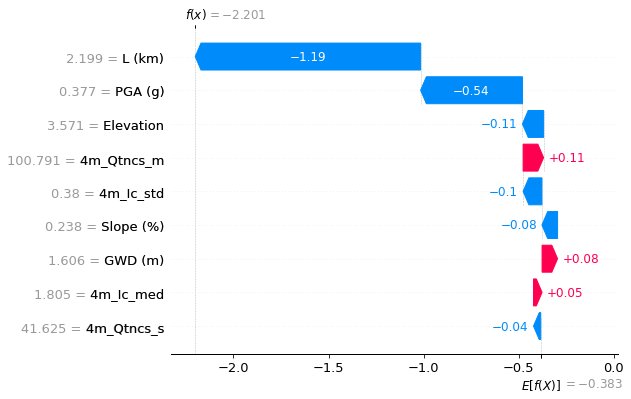

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


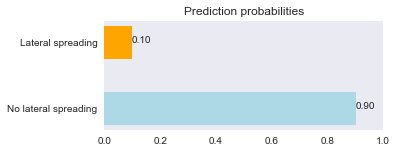

Percentile compare to the overall dataset


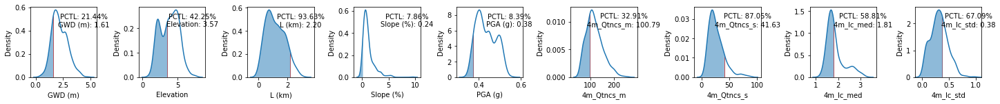

In [93]:
plot_summary(2, tn_shap_values, X_true_neg)

### True negative at short distances (L)

In [94]:
tn.loc[tn['L (km)'] < 0.5].loc[tn['GWD (m)'] > 3]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
21,1805,25621.0,3.443651,3.972750,0.169952,1.890133,0.426905,121.250245,21.533518,1.728418,0.282009,0,0
33,5097,4014.0,3.406002,4.500816,0.241764,1.034272,0.439723,129.568989,38.622164,1.593574,0.357406,0,0
35,1558,12460.0,3.095618,3.997163,0.421687,1.024821,0.413012,123.506380,34.246677,1.668654,0.397008,0,0
202,919,17611.0,3.370925,3.600594,0.386230,0.619478,0.476612,155.271377,25.289573,1.646045,0.153408,0,0
226,1386,37741.0,3.456206,3.693008,0.169971,3.791025,0.408041,113.657766,25.365575,1.759967,0.448210,0,0
238,257,15617.0,3.809646,4.403340,0.181716,1.720116,0.449553,118.529707,26.153033,1.631974,0.177369,0,0
250,912,17484.0,3.317045,3.609877,0.452786,0.847155,0.474041,146.688468,26.617104,1.624855,0.181187,0,0
370,5074,5970.0,3.044290,4.290203,0.287614,0.383352,0.439723,168.672070,51.122607,1.458883,0.284940,0,0


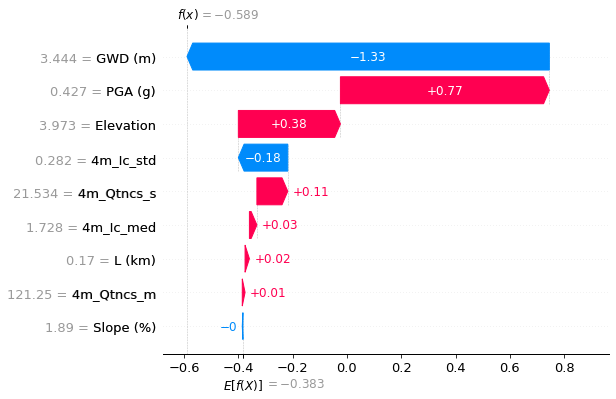

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


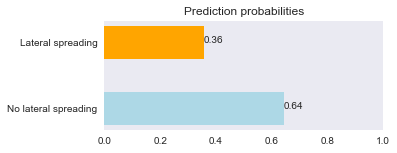

Percentile compare to the overall dataset


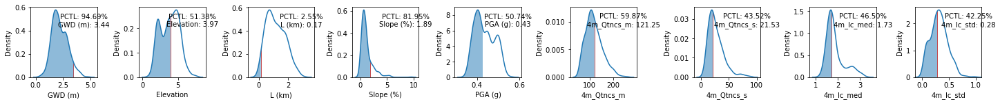

In [95]:
# visualize no lateral spreading prediction's explanation (3)
idx = 21
plot_summary(idx, tn_shap_values, X_true_neg)

# False positive

In [96]:
# Error is 1 means prediction 1 (lateral spreading) while target is 0 (no-lateral spreading)
fp = testdf[testdf['error'] == 1]
X_false_pos = fp.drop(['Test ID', 'Target', 'error'], axis=1)
fp = fp.reset_index()
fp.head()

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
0,2850,2556.0,2.249877,4.979225,0.984994,2.167620,0.450196,115.353792,30.433484,1.729468,0.281977,0,1
1,6300,15303.0,2.010932,2.136515,0.205895,1.333204,0.447333,96.456988,12.865559,1.897782,0.196317,0,1
2,4108,32511.0,0.808329,4.335538,2.529715,0.395249,0.374701,76.033460,10.797263,2.416245,0.414202,0,1
3,3094,37532.0,2.487671,3.958574,1.492929,1.000127,0.426441,143.851251,33.187041,1.581559,0.146186,0,1
4,3879,33830.0,2.408835,4.481244,1.687515,0.531799,0.463272,153.212360,15.781763,1.564090,0.071017,0,1


Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


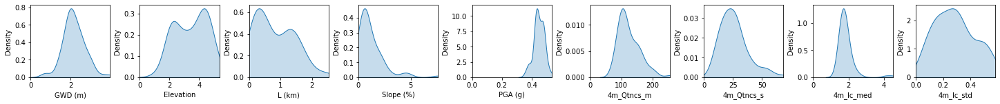

In [97]:
plots.distribution(X_false_pos)

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


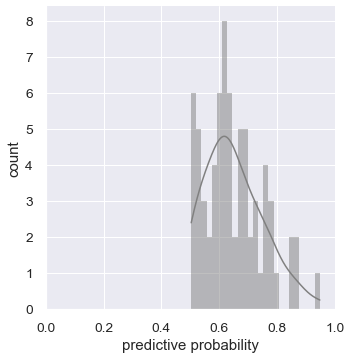

In [98]:
# Prediction probability
prob = model.predict_proba(X_false_pos)
plots.pred_prob(prob[:,1])

In [99]:
# SHAP values of false positive dataset
fp_shap_values = explainer(X_false_pos)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


### Specific site
> 7674

In [158]:
X_train_target[X_train_target['Test ID']==7674]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target
2358,493,7674.0,2.294972,5.55751,1.324627,3.255037,0.487165,142.321007,59.188374,1.617662,0.30136,0


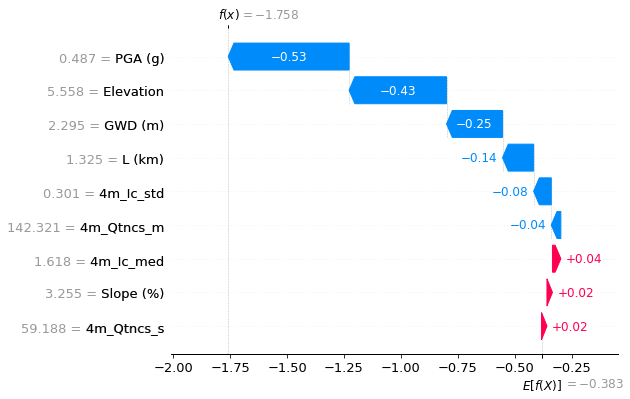

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


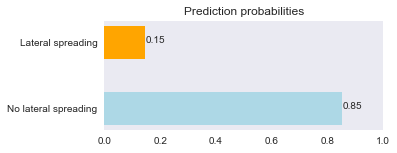

Percentile compare to the overall dataset


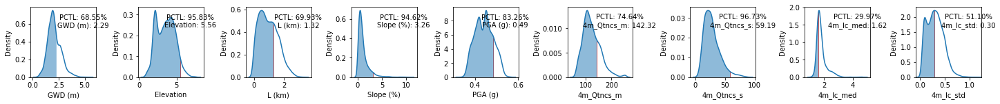

In [159]:
# visualize no lateral spreading prediction explanation
idx = 2358
plot_summary(idx, shap_values, X_train)

## Fails for close distance to river

In [100]:
fp.head()

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
0,2850,2556.0,2.249877,4.979225,0.984994,2.167620,0.450196,115.353792,30.433484,1.729468,0.281977,0,1
1,6300,15303.0,2.010932,2.136515,0.205895,1.333204,0.447333,96.456988,12.865559,1.897782,0.196317,0,1
2,4108,32511.0,0.808329,4.335538,2.529715,0.395249,0.374701,76.033460,10.797263,2.416245,0.414202,0,1
3,3094,37532.0,2.487671,3.958574,1.492929,1.000127,0.426441,143.851251,33.187041,1.581559,0.146186,0,1
4,3879,33830.0,2.408835,4.481244,1.687515,0.531799,0.463272,153.212360,15.781763,1.564090,0.071017,0,1


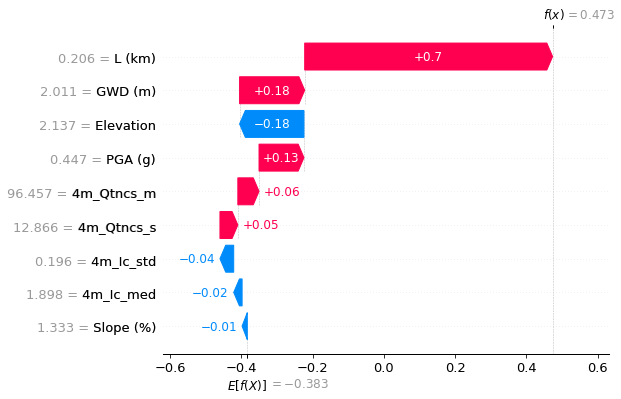

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


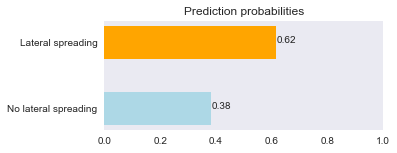

Percentile compare to the overall dataset


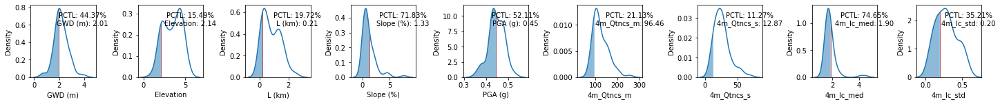

In [101]:
# visualize lateral spreading prediction's explanation - The elevation and slope values are zero
idx=1
plot_summary(idx, fp_shap_values, X_false_pos)

## High PGA

In [102]:
fp.loc[fp['PGA (g)'] > 0.5]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
30,4025,49583.0,1.441320,1.719072,0.106885,0.484874,0.513081,116.731116,41.437979,1.645084,0.487564,0,1
41,1283,18932.0,2.484206,2.329316,0.579356,1.514518,0.500029,113.242391,13.672440,1.675787,0.146194,0,1
55,3792,165.0,1.541658,1.082347,0.419804,0.055332,0.508967,91.389462,9.201822,1.927885,0.180179,0,1
70,8,170.0,1.809964,2.104903,0.007099,1.904443,0.532439,107.963905,47.439255,4.482875,0.580077,0,1


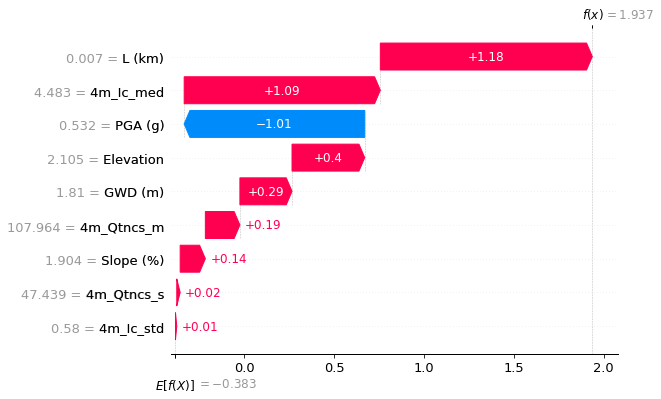

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


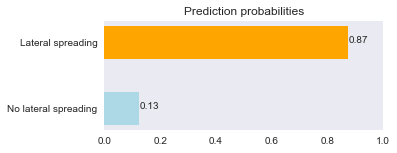

Percentile compare to the overall dataset


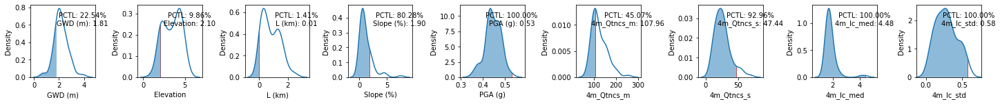

In [103]:
plot_summary(70, fp_shap_values, X_false_pos)

### Low PGAs triggering liquefaction all these points are at high elevation

In [104]:
fp.loc[fp['PGA (g)'] < 0.4]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
2,4108,32511.0,0.808329,4.335538,2.529715,0.395249,0.374701,76.033460,10.797263,2.416245,0.414202,0,1
19,4186,1979.0,0.672116,4.500198,1.686450,0.869256,0.392648,77.691622,27.531100,2.343134,0.505492,0,1
20,1353,17153.0,3.956353,5.163883,1.465592,1.699926,0.354658,200.630273,25.993771,1.524720,0.056876,0,1
21,4920,40852.0,2.551171,5.359774,1.966800,0.136693,0.383534,95.426374,12.015721,1.822066,0.303972,0,1
57,1693,24603.0,2.401103,4.577996,2.296437,7.587110,0.370285,92.036410,19.331974,2.070880,0.457388,0,1
62,4764,617.0,2.263490,4.617346,1.854529,0.852443,0.385105,187.864762,53.588102,1.425135,0.265968,0,1
65,5053,16674.0,2.431887,4.694706,1.814048,0.852509,0.382827,254.000000,25.780327,1.335214,0.167546,0,1


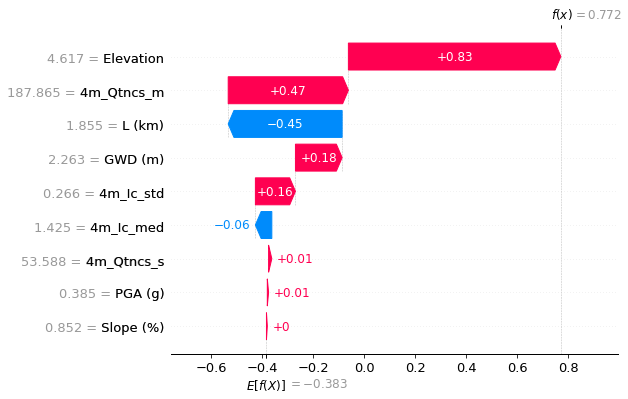

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


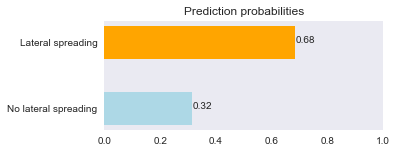

Percentile compare to the overall dataset


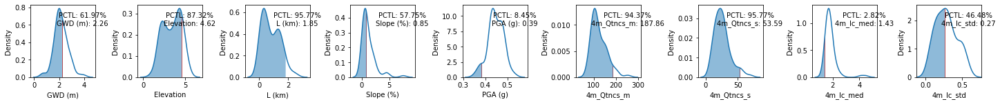

In [105]:
plot_summary(62, fp_shap_values, X_false_pos)

# False negatives

In [106]:
# Error is -1 means prediction 0 (no-lateral spreading) while target is 1 (lateral spreading)
fn = testdf[testdf['error'] == -1]

X_false_neg = fn.drop(['Test ID', 'Target', 'error'], axis=1)
fn = fn.reset_index()
fn.head()

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
0,548,50087.0,2.672677,5.201716,1.491173,0.845040,0.489705,116.609040,33.095266,1.661254,0.210549,1,-1
1,4765,19040.0,1.341540,4.350372,1.440649,4.239730,0.398334,79.651730,15.243180,2.510785,0.453985,1,-1
2,5640,15700.0,0.776125,1.867309,0.463957,0.338019,0.446241,95.864019,32.439581,1.575119,0.189286,1,-1
3,6004,38301.0,3.475307,3.356515,0.044242,3.295177,0.424457,119.117902,39.626905,1.692034,0.352426,1,-1
4,4827,576.0,2.279008,4.479140,1.209794,0.193522,0.404195,238.836449,27.631939,1.322006,0.142451,1,-1


pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


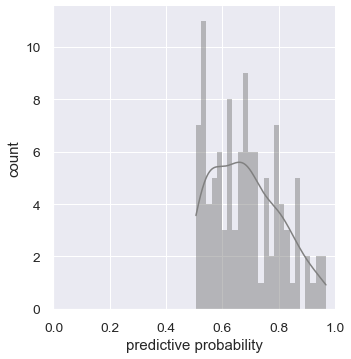

In [107]:
# Prediction probability
prob = model.predict_proba(X_false_neg)
plots.pred_prob(prob[:,0])

In [108]:
# SHAP values of false negative dataset
fn_shap_values = explainer(X_false_neg)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


### Site specific
> 37333

In [174]:
X_train_target[X_train_target['Test ID']==37333.0]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target
3051,1586,37333.0,2.292893,4.621037,1.950595,0.173166,0.374504,106.587592,32.779181,1.693569,0.588382,1


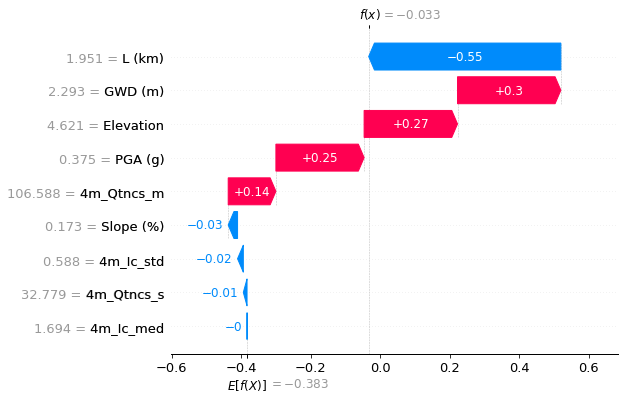

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


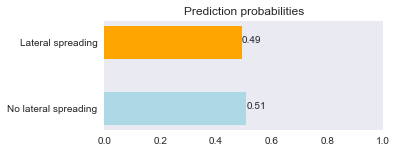

Percentile compare to the overall dataset


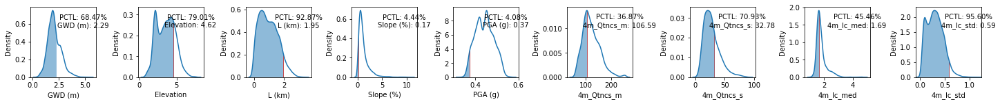

In [176]:
# visualize no lateral spreading prediction explanation
idx = 3051
plot_summary(idx, shap_values, X_train)

### Distance is too far

In [109]:
fn.loc[fn['L (km)'] > 2]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
15,4116,34718.0,1.027273,4.724062,2.233438,0.506840,0.377765,86.287057,54.672858,1.735354,0.673465,1,-1
16,4131,16689.0,0.851762,4.310924,2.367820,0.679290,0.377765,67.510526,18.530509,2.590927,0.478253,1,-1
20,6609,48656.0,2.302286,5.847261,2.739961,0.545546,0.364377,62.984876,17.100792,3.132735,0.497373,1,-1
99,1605,37331.0,2.493565,4.770171,2.015940,3.180131,0.371414,77.586808,32.332844,2.692352,0.573751,1,-1


### Specific site 38301

In [140]:
fn[fn['Test ID']==38301.0]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
3,6004,38301.0,3.475307,3.356515,0.044242,3.295177,0.424457,119.117902,39.626905,1.692034,0.352426,1,-1


In [139]:
d = fn[fn['Test ID']==38301.0]
d = d.drop(['index', 'Test ID', 'Target', 'error'], axis=1)
model.predict_proba(d)

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


array([[0.65979755, 0.34020248]], dtype=float32)

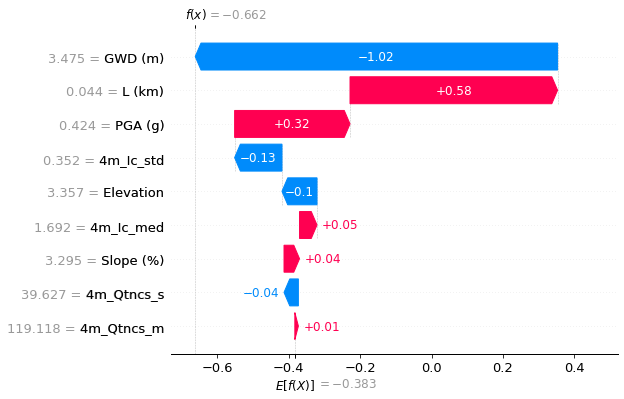

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


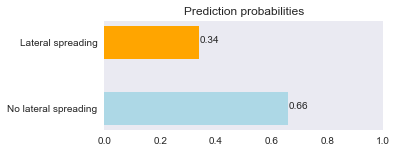

Percentile compare to the overall dataset


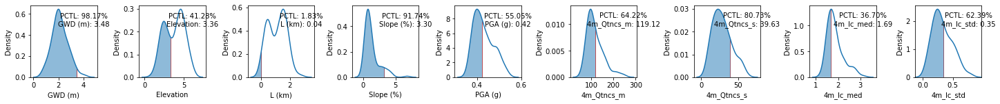

In [141]:
# The elevation and slope values are zero
idx=3
plot_summary(idx, fn_shap_values, X_false_neg)

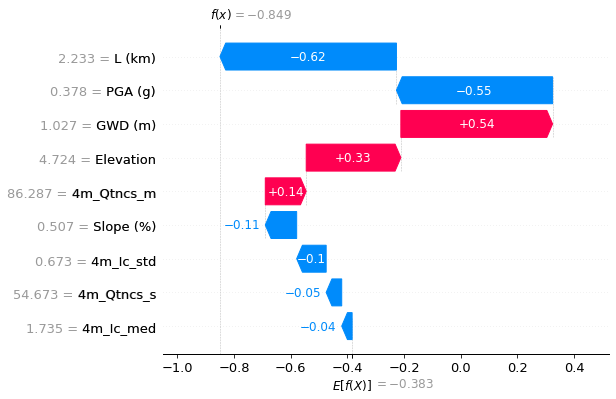

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


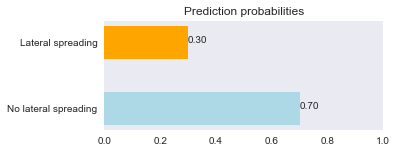

Percentile compare to the overall dataset


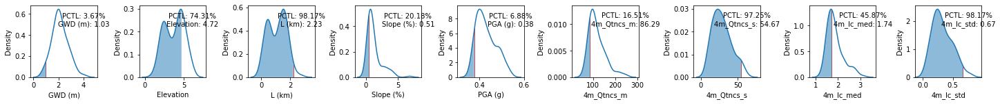

In [111]:
# The elevation and slope values are zero
idx=15
plot_summary(idx, fn_shap_values, X_false_neg)

### Distance is close but predicts false negative value

In [112]:
fn.loc[fn['L (km)'] < 0.5]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
2,5640,15700.0,0.776125,1.867309,0.463957,0.338019,0.446241,95.864019,32.439581,1.575119,0.189286,1,-1
3,6004,38301.0,3.475307,3.356515,0.044242,3.295177,0.424457,119.117902,39.626905,1.692034,0.352426,1,-1
7,706,9056.0,2.109729,2.325703,0.333431,0.579430,0.453837,111.852249,27.355869,1.713557,0.368922,1,-1
9,6,161.0,1.884515,1.692008,0.064009,0.173425,0.535902,81.374369,16.628923,1.995113,0.266370,1,-1
13,6355,28953.0,1.872189,1.954347,0.261155,1.020559,0.449792,110.380841,15.709506,1.899724,0.217228,1,-1
22,6360,28952.0,2.083289,2.315980,0.290537,0.426429,0.449792,113.531928,20.804560,1.760748,0.215903,1,-1
23,6031,5060.0,2.109565,2.485610,0.477694,0.505582,0.464307,106.699453,29.662932,1.750924,0.285607,1,-1
25,5364,5128.0,3.174659,3.583609,0.032414,0.472594,0.446654,165.297495,54.438679,1.577709,0.216109,1,-1
31,188,48147.0,1.082345,1.651046,0.436470,1.148642,0.421927,114.468197,36.288163,1.729866,0.651254,1,-1
32,6274,25697.0,1.676958,2.153806,0.487379,0.965374,0.448203,102.250821,14.114398,1.945969,0.235084,1,-1


### Deeper GWD

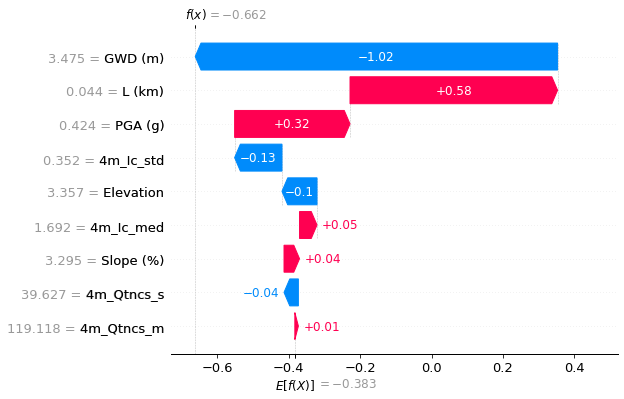

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


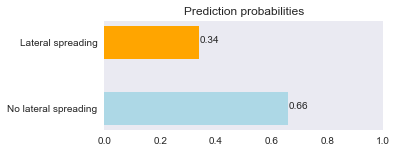

Percentile compare to the overall dataset


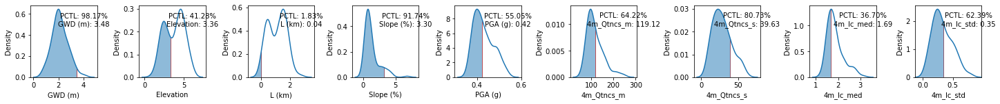

In [113]:
idx = 3
plot_summary(3, fn_shap_values, X_false_neg)

#### Shallow GWD < 2m 

In [114]:
fn.loc[fn['L (km)'] < 0.5].loc[fn['GWD (m)'] < 2]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std,Target,error
2,5640,15700.0,0.776125,1.867309,0.463957,0.338019,0.446241,95.864019,32.439581,1.575119,0.189286,1,-1
9,6,161.0,1.884515,1.692008,0.064009,0.173425,0.535902,81.374369,16.628923,1.995113,0.266370,1,-1
13,6355,28953.0,1.872189,1.954347,0.261155,1.020559,0.449792,110.380841,15.709506,1.899724,0.217228,1,-1
31,188,48147.0,1.082345,1.651046,0.436470,1.148642,0.421927,114.468197,36.288163,1.729866,0.651254,1,-1
32,6274,25697.0,1.676958,2.153806,0.487379,0.965374,0.448203,102.250821,14.114398,1.945969,0.235084,1,-1
48,1992,32959.0,1.930622,2.487270,0.465034,0.900893,0.428506,100.288633,16.465578,1.870081,0.286681,1,-1
61,6337,31664.0,1.783756,2.093882,0.329963,0.335633,0.449792,126.516880,14.747853,1.694108,0.275800,1,-1
63,1996,4627.0,1.960416,2.502589,0.499831,0.997651,0.425247,103.913876,23.720308,1.780695,0.318362,1,-1
76,739,83.0,1.877862,1.866743,0.342501,0.992732,0.456291,100.984915,13.360084,2.010835,0.210185,1,-1


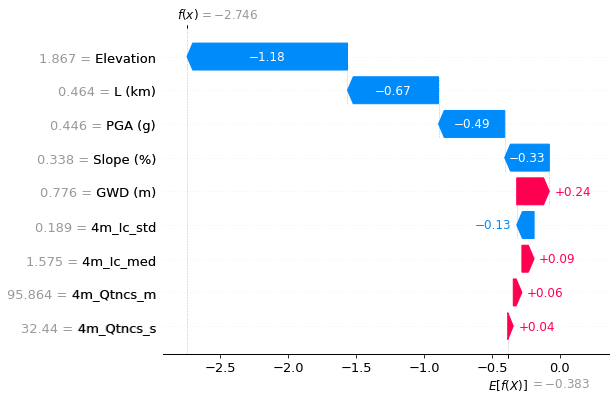

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


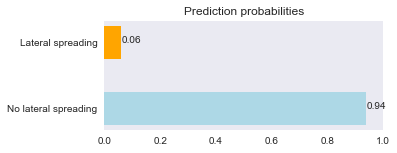

Percentile compare to the overall dataset


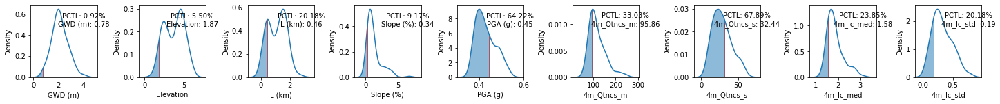

In [115]:
idx = 2
plot_summary(idx, fn_shap_values, X_false_neg)

### Where high PGA affects the results

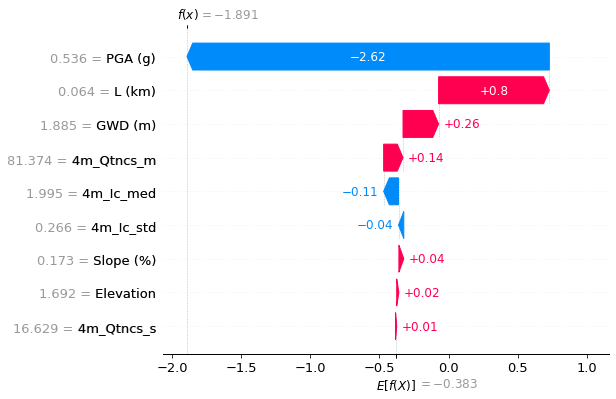

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


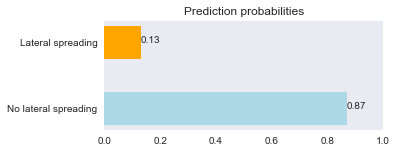

Percentile compare to the overall dataset


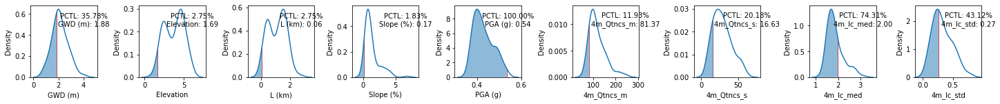

In [116]:
idx = 9
plot_summary(idx, fn_shap_values, X_false_neg)

# Global explanations

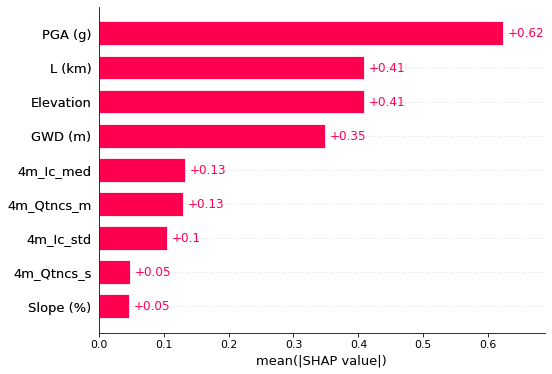

In [117]:
shap.plots.bar(shap_values)

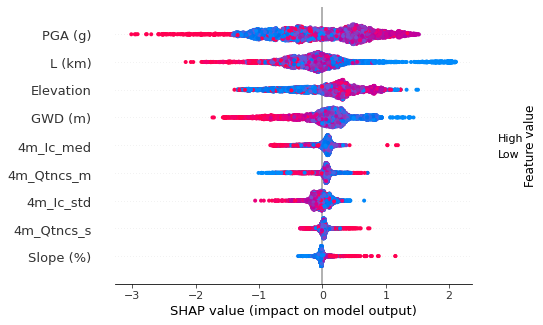

In [118]:
# summarize the effects of all the features
shap.plots.beeswarm(shap_values)

## True Positives

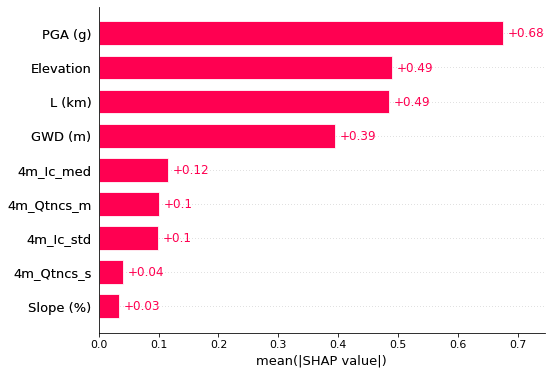

In [119]:
shap.plots.bar(tp_shap_values)

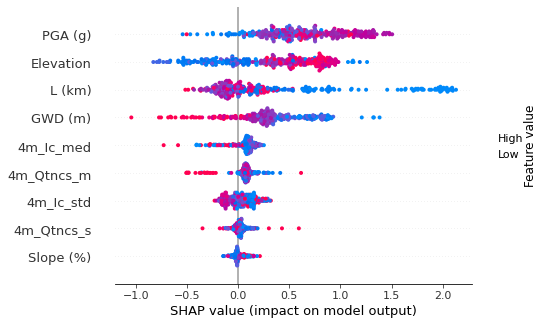

In [120]:
# summarize the effects of all the features
shap.plots.beeswarm(tp_shap_values)

### True negative

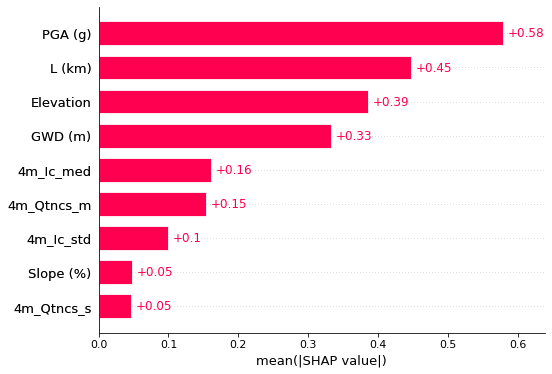

In [121]:
shap.plots.bar(tn_shap_values)

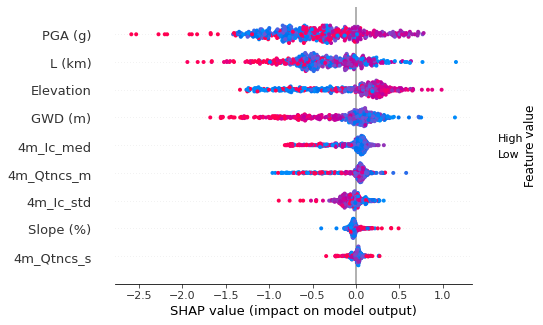

In [122]:
shap.plots.beeswarm(tn_shap_values)

### False positives

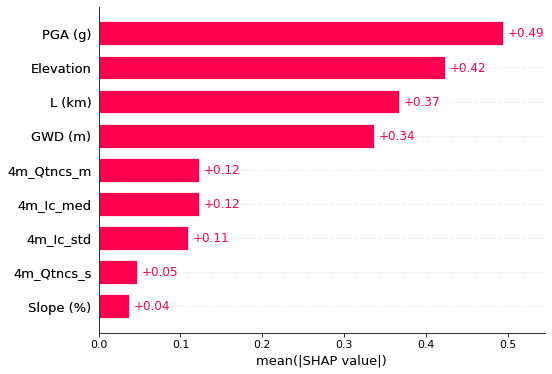

In [123]:
shap.plots.bar(fp_shap_values)

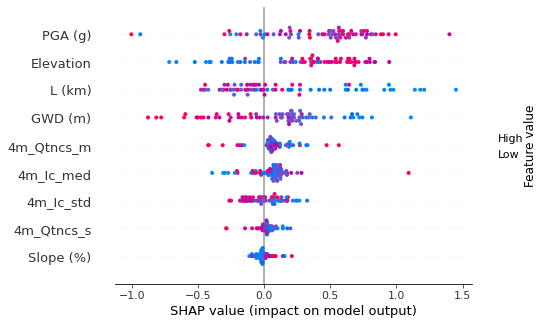

In [124]:
shap.plots.beeswarm(fp_shap_values)

### False Negative

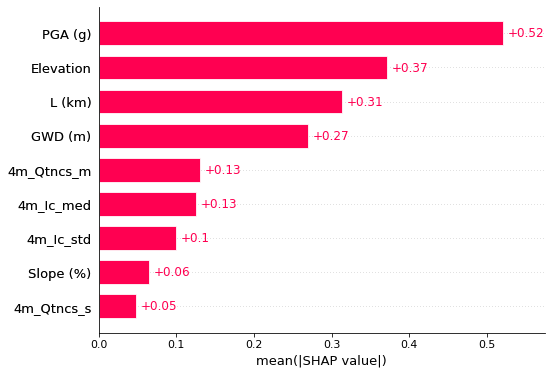

In [125]:
shap.plots.bar(fn_shap_values)

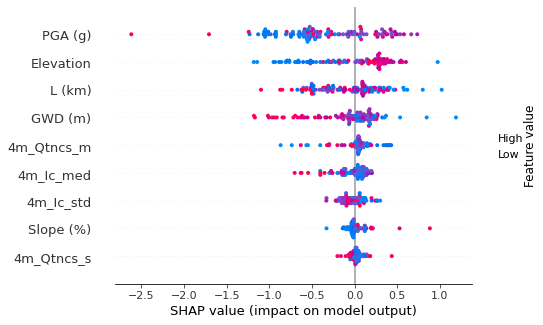

In [126]:
shap.plots.beeswarm(fn_shap_values)

# Feature relations

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.


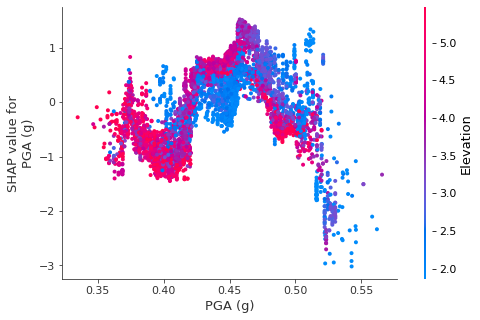

In [127]:
# explain the model's predictions using SHAP
# compute SHAP values
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)
shap.dependence_plot('PGA (g)', shap_values, X_train, interaction_index="Elevation")

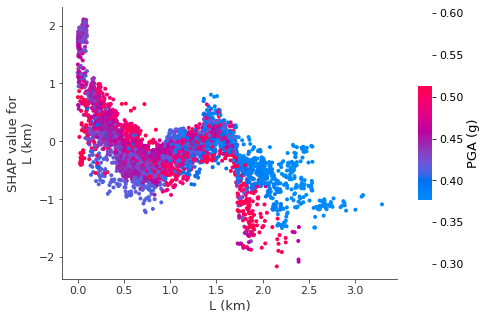

In [128]:
shap.dependence_plot('L (km)', shap_values, X_train)

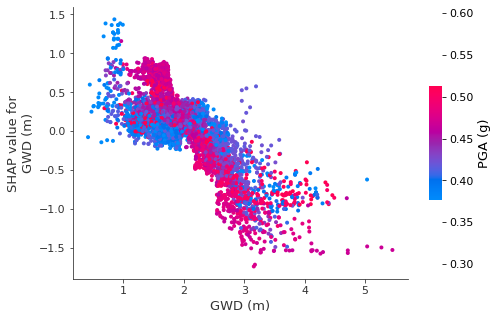

In [129]:
shap.dependence_plot('GWD (m)', shap_values, X_train)

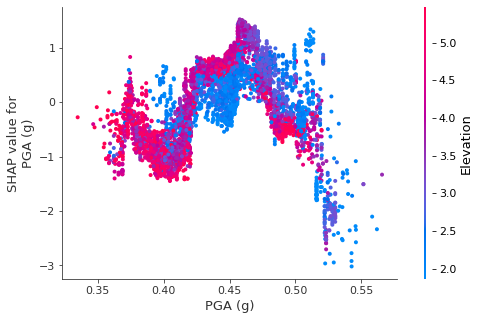

In [130]:
shap.dependence_plot('PGA (g)', shap_values, X_train)

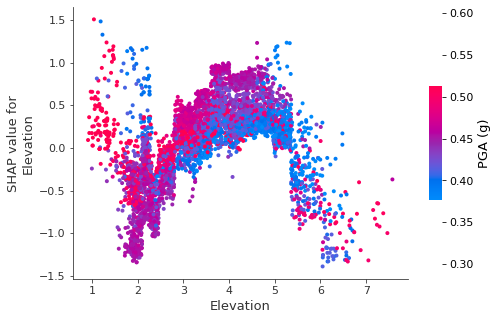

In [131]:
shap.dependence_plot('Elevation', shap_values, X_train)

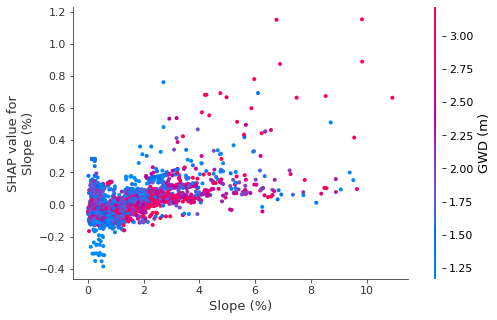

In [132]:
shap.dependence_plot('Slope (%)', shap_values, X_train)

In [133]:
X_train.head()

,GWD (m),Elevation,L (km),Slope (%),PGA (g),4m_Qtncs_m,4m_Qtncs_s,4m_Ic_med,4m_Ic_std
6043,1.718826,1.811603,0.535128,0.397376,0.440895,130.469944,31.164076,1.701118,0.434006
5613,1.518877,2.115037,0.380435,0.459704,0.457163,89.324877,20.448650,1.988205,0.301661
4002,1.316730,1.710117,0.234274,0.623473,0.508720,215.483162,14.022323,1.407359,0.059551
1067,2.401471,3.330867,1.718972,2.861161,0.516319,116.008408,14.196668,1.927262,0.184131
854,2.585827,2.902272,0.585417,0.030798,0.471470,162.944311,13.026224,1.595586,0.045170


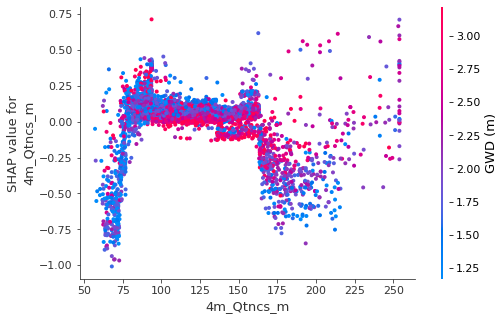

In [134]:
shap.dependence_plot('4m_Qtncs_m', shap_values, X_train)

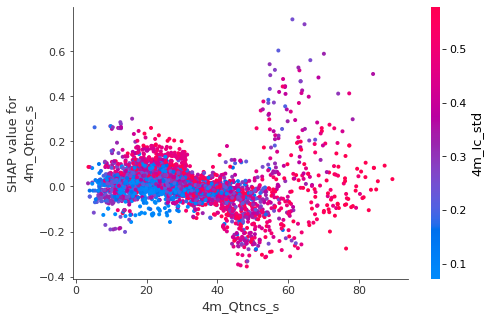

In [135]:
shap.dependence_plot('4m_Qtncs_s', shap_values, X_train)

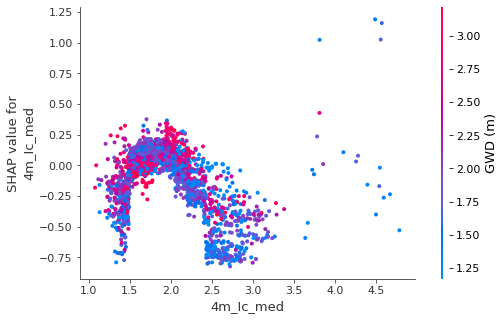

In [136]:
shap.dependence_plot('4m_Ic_med', shap_values, X_train)

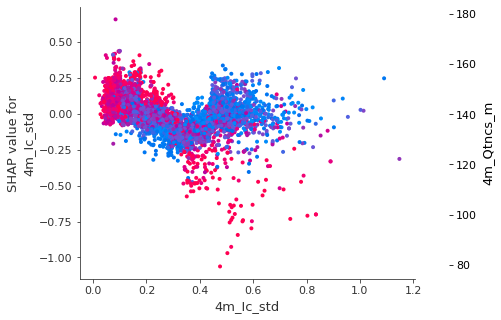

In [137]:
shap.dependence_plot('4m_Ic_std', shap_values, X_train)